Show all your code to acquire the dataset in your notebook

In [299]:
import requests
import pandas as pd
import numpy as np
import io
import matplotlib.pyplot as plt
import us
import plotly.graph_objects as go
#conda install -c plotly/label/test plotly
import seaborn as sns

#If data needs to be loaded from CSV
USGS=pd.read_csv("USGS_BDP_HW4.csv")

In [218]:
#If data is loaded from CSV then EXECUTING THIS BLOCK IS NOT REQUIRED
#Run this block only if need current data, and to create CSV
response1 = requests.get("https://earthquake.usgs.gov/fdsnws/event/1/query?format=csv&starttime=2016-01-01&endtime=2017-01-01&minmagnitude=4")
response1_df = pd.read_csv(io.StringIO(response1.content.decode('utf-8')))
response2 = requests.get("https://earthquake.usgs.gov/fdsnws/event/1/query?format=csv&starttime=2017-01-01&endtime=2018-01-01&minmagnitude=4")
response2_df = pd.read_csv(io.StringIO(response2.content.decode('utf-8')))
response3 = requests.get("https://earthquake.usgs.gov/fdsnws/event/1/query?format=csv&starttime=2018-01-01&endtime=2019-01-01&minmagnitude=4")
response3_df = pd.read_csv(io.StringIO(response3.content.decode('utf-8')))
response4 = requests.get("https://earthquake.usgs.gov/fdsnws/event/1/query?format=csv&starttime=2019-01-01&endtime=2019-10-02&minmagnitude=4")
response4_df = pd.read_csv(io.StringIO(response4.content.decode('utf-8')))

USGS=response1_df.append(response2_df)
USGS=USGS.append(response3_df)
USGS=USGS.append(response4_df)
USGS=USGS[USGS['type']=='earthquake']

#data = pd.read_csv("filename.csv")
USGS.to_csv(r'USGS_BDP_HW4.csv')
USGS=pd.read_csv("USGS_BDP_HW4.csv")

Use describe to get the basic statistics of all the columns

In [219]:
USGS.describe()

,Unnamed: 0,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
count,52959.000000,52959.000000,52959.000000,52959.000000,52959.000000,337.000000,52114.000000,52069.000000,52959.000000,52517.000000,52959.000000,51244.000000,51385.000000
mean,6789.751921,1.885564,34.104685,94.245405,4.526332,47.314540,110.730916,3.713611,0.827317,8.755140,5.449539,0.121078,42.224326
std,4080.604870,28.965056,124.270649,147.881661,0.397879,35.342401,51.022761,4.737854,0.262203,3.650955,4.190541,0.065075,61.167835
min,0.000000,-79.983700,-179.998600,-0.930000,4.000000,4.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3310.000000,-19.517150,-74.362700,10.000000,4.300000,23.000000,73.000000,1.173000,0.650000,6.300000,1.900000,0.073000,12.000000
50%,6620.000000,-3.359300,94.026300,33.930000,4.500000,37.000000,106.000000,2.382000,0.810000,8.200000,4.800000,0.112000,21.000000
75%,9947.500000,24.320000,141.912750,106.185000,4.700000,64.000000,143.000000,4.400000,0.990000,10.800000,7.900000,0.153000,45.000000
max,15396.000000,86.996400,179.999300,690.950000,8.200000,289.000000,346.000000,62.626000,2.530000,51.700000,69.300000,1.000000,854.000000


Get the top 10 earthquakes by magnitude

In [271]:
USGS_lar=USGS.nlargest(10,'mag',keep='all')
USGS_lar=USGS_lar.reset_index(drop=True)
USGS_lar.style

,Unnamed: 0,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,net,id,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource,UScheck
0,4525,2017-09-08T04:49:19.180Z,15.0222,-93.8993,47.39,8.2,mww,0,22,0.944,1.22,us,us2000ahv0,2019-09-12T03:25:23.535Z,"101km SSW of Tres Picos, Mexico",earthquake,6.2,3.7,0.058,29,reviewed,us,us,nan
1,6256,2018-08-19T00:19:40.670Z,-18.1125,-178.153,600,8.2,mww,0,13,3.63,0.79,us,us1000gcii,2019-08-19T06:18:42.402Z,"286km NNE of Ndoi Island, Fiji",earthquake,9.6,1.9,0.045,47,reviewed,us,us,nan
2,4567,2019-05-26T07:41:15.073Z,-5.8119,-75.2697,122.57,8,mww,0,17,3.18,0.84,us,us60003sc0,2019-10-20T00:29:23.662Z,"78km SE of Lagunas, Peru",earthquake,7,4,0.036,75,reviewed,us,us,nan
3,789,2016-12-17T10:51:10.500Z,-4.5049,153.522,94.54,7.9,mww,0,13,1.389,0.97,us,us200081v8,2018-10-17T21:50:55.380Z,"54km E of Taron, Papua New Guinea",earthquake,7.3,3.8,0,0,reviewed,us,us,nan
4,12311,2017-01-22T04:30:22.960Z,-6.2464,155.172,135,7.9,mww,0,9,3.625,1.22,us,us10007uph,2018-10-17T21:53:19.164Z,"35km WNW of Panguna, Papua New Guinea",earthquake,7.3,1.8,0.042,54,reviewed,us,us,nan
5,5168,2018-09-06T15:49:18.710Z,-18.4743,179.35,670.81,7.9,mww,0,12,1.431,1.07,us,us2000h9e2,2019-04-23T04:45:27.592Z,"102km ESE of Suva, Fiji",earthquake,9.5,2.8,0.025,157,reviewed,us,us,nan
6,13823,2018-01-23T09:31:40.890Z,56.0039,-149.166,14.06,7.9,mww,0,30,2.585,0.77,us,us2000cmy3,2019-07-01T15:34:15.502Z,"280km SE of Kodiak, Alaska",earthquake,6,2.8,0.034,81,reviewed,us,us,Alaska
7,1335,2016-12-08T17:38:46.280Z,-10.6812,161.327,40,7.8,mww,0,13,1.836,0.88,us,us20007z80,2018-10-17T21:50:46.404Z,"69km WSW of Kirakira, Solomon Islands",earthquake,8.3,1.8,0,0,reviewed,us,us,nan
8,2674,2016-11-13T11:02:56.340Z,-42.7373,173.054,15.11,7.8,mww,0,21,0.481,0.56,us,us1000778i,2019-04-15T21:55:36.454Z,"54km NNE of Amberley, New Zealand",earthquake,4.6,3.2,0,0,reviewed,us,us,nan
9,11284,2016-04-16T23:58:36.980Z,0.3819,-79.9218,20.59,7.8,mww,0,15,1.44,0.94,us,us20005j32,2019-10-15T14:06:57.770Z,"27km SSE of Muisne, Ecuador",earthquake,5.7,3.2,0,0,reviewed,us,us,nan


Handle all Null/empty data by filling it with zeros

In [221]:
#print(USGS.isna().sum())
USGS=USGS.fillna(0)
#print(USGS.isna().sum())

Find the top 10 places where the strongest earthquakes occurred

In [275]:
USGS_loc=pd.DataFrame(USGS.nlargest(10,'mag')['place'])
USGS_loc=USGS_loc.apply(lambda x: x[0].split('of')[1],axis=1)
USGS_loc=USGS_loc.reset_index(drop=True)
print(USGS_loc)

0            Tres Picos, Mexico
1             Ndoi Island, Fiji
2                 Lagunas, Peru
3       Taron, Papua New Guinea
4     Panguna, Papua New Guinea
5                    Suva, Fiji
6                Kodiak, Alaska
7     Kirakira, Solomon Islands
8         Amberley, New Zealand
9               Muisne, Ecuador
dtype: object


Find the top 10 places where the weakest earthquakes occurred

In [278]:
USGS_loc=pd.DataFrame(USGS.nsmallest(10,'mag')['place'])
USGS_loc=USGS_loc.apply(lambda x: x[0].split('of')[1],axis=1)
USGS_loc=USGS_loc.reset_index(drop=True)
print(USGS_loc)

0                  Kota Ternate, Indonesia
1                         the Fiji Islands
2                    Khrisokhorion, Greece
3                     San Andres, Colombia
4                          La Ligua, Chile
5     San Antonio de los Cobres, Argentina
6                  El Rosario, El Salvador
7                    Puerto Quellon, Chile
8        Agrihan, Northern Mariana Islands
9                        Ndoi Island, Fiji
dtype: object


On a per-year basis, use a bar chart to plot the number of earthquakes for each of the following
magnitude groups ranges: Group 1: [4,4.5), Group 2: [4.5,5), Group 3: [5,6), Group 4: [6,7), Group 5:
(7,MAX]. Pay close attention to the group ranges. (20 points) Please add labels and colors to the plot

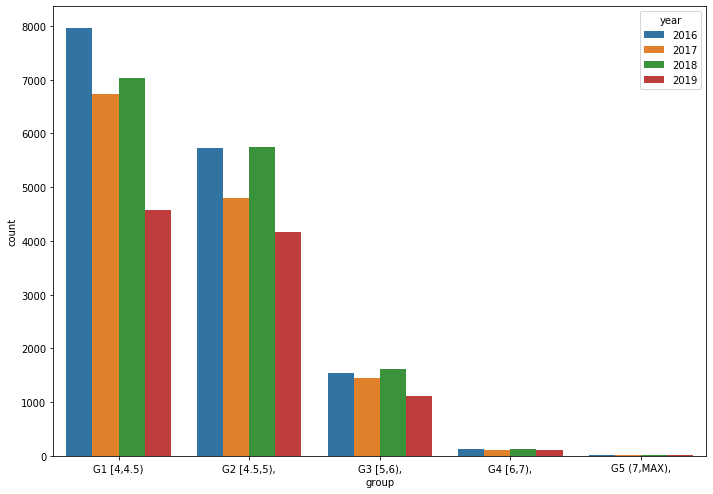

In [312]:
def categorize(USGS_201n, group_interval, group_names):
    group_intervals = [pd.Interval(*gi) for gi in group_interval]
    groups = []
    for mag in USGS_201n:
        GroupN = None
        for i, mag_group in enumerate(group_intervals):
            if mag in mag_group:
                GroupN = group_names[i]
                break
        groups.append(GroupN)
    #print(groups)
    return groups

group_interval=[(4,4.5,'left'),(4.5,5,'left'),(5,6,'left'),(6,7,'left'),(7,10,'right')]
group_names=['G1 [4,4.5)', 'G2 [4.5,5),', 'G3 [5,6),', 'G4 [6,7),', 'G5 (7,MAX),']

years=['2016','2017','2018','2019']
df4plot=pd.DataFrame()
df4plotf=pd.DataFrame()
for i, year in enumerate(years):
    USGS_year=USGS.loc[USGS.apply(lambda x: x['time'].split('-')[0]==year,axis=1),'mag']
    group=categorize(USGS_year, group_interval, group_names)
    df4plot=pd.DataFrame()
    df4plot['group']=group
    df4plot['year']=year
    df4plotf=df4plotf.append(df4plot)

df4plotf=df4plotf.sort_values(by=['group'])

a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
ax = sns.countplot(x="group", hue="year", data=df4plotf)

Trying other methods for plotting for same que-- 
On a per-year basis, use a bar chart to plot the number of earthquakes for each of the following
magnitude groups ranges: Group 1: [4,4.5), Group 2: [4.5,5), Group 3: [5,6), Group 4: [6,7), Group 5:
(7,MAX]. Pay close attention to the group ranges. (20 points) Please add labels and colors to the plot.

[7968.0, 5729.0, 1548.0, 131.0, 13.0]
[6740.0, 4804.0, 1447.0, 103.0, 6.0]
[7033.0, 5738.0, 1617.0, 118.0, 15.0]
[4571.0, 4157.0, 1106.0, 100.0, 8.0]


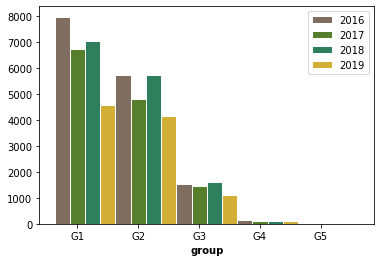

In [340]:
#OR
def categorize(USGS_201n, group_interval, group_names):
    group_intervals = [pd.Interval(*gi) for gi in group_interval]
    groups = []
    for mag in USGS_201n:
        GroupN = None
        for i, mag_group in enumerate(group_intervals):
            if mag in mag_group:
                GroupN = group_names[i]
                break
        groups.append(GroupN)
    #print(groups)
    return groups

group_interval=[(4,4.5,'left'),(4.5,5,'left'),(5,6,'left'),(6,7,'left'),(7,10,'right')]
group_names=['G1 [4,4.5)', 'G2 [4.5,5),', 'G3 [5,6),', 'G4 [6,7),', 'G5 (7,MAX),']

df4plot=pd.DataFrame()
df4plotf=pd.DataFrame()

def garrayf (years):
    for i, year in enumerate(years):
        USGS_year=USGS.loc[USGS.apply(lambda x: x['time'].split('-')[0]==year,axis=1),'mag']
        group=categorize(USGS_year, group_interval, group_names)
        df4plot=pd.DataFrame()
        df4plot['group']=group
        df4plot['year']=year
        #df4plotf=df4plotf.append(df4plot)
        df4plot['freq'] = df4plot.groupby('group')['group'].transform('count')
        df4plot=df4plot[['group','freq']]
        df4plot=df4plot.drop_duplicates(subset='group',keep='first')
        df4plot=df4plot.sort_values(by=['group'], ascending=True)
        df4plot5=df4plot['freq'].head(5)
        garray=df4plot5.tolist()
    return garray

a2016=garrayf(['2016'])
#print(a2016)
a2017=garrayf(['2017'])
#print(a2017)
a2018=garrayf(['2018'])
#print(a2018)
a2019=garrayf(['2019'])
#print(a2019)

barWidth = 0.25
re1 = np.arange(len(a2016))
re2 = [x + barWidth for x in r1]
re3 = [x + barWidth for x in r2]
re4 = [x + barWidth for x in r3]

# Make the plot
plt.bar(re1, a2016, color='#7f6d5f', width=barWidth, edgecolor='white', label='2016')
plt.bar(re2, a2017, color='#557f2d', width=barWidth, edgecolor='white', label='2017')
plt.bar(re3, a2018, color='#2d7f5e', width=barWidth, edgecolor='white', label='2018')
plt.bar(re4, a2019, color='#d4af37', width=barWidth, edgecolor='white', label='2019')
 
# Add xticks on the middle of the group bars
plt.xlabel('group', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(a2016))], ['G1', 'G2', 'G3', 'G4', 'G5'])
 
# Create legend & Show graphic
plt.legend()
plt.show()



Find the 10 countries with the highest number of earthquakes (30 points) (Note: Yes, this is only
countries, not full place)

In [283]:
USGS_con=pd.DataFrame(USGS[['mag','place']])
con=USGS_con['place'].str.split(', ').tolist()
country=[]
for i,sub_list in enumerate(con):
    if(len(sub_list)<2):
        sub_list.append(np.nan)
    country.append(sub_list[1])
USGS_con['place']=country

USGS_con['freq'] = USGS_con.groupby('place')['place'].transform('count')
USGS_con=USGS_con[['place','freq']]
USGS_con=USGS_con.drop_duplicates(subset='place',keep='first')
USGS_con=USGS_con.sort_values(by=['freq'], ascending=False)
USGS_con=USGS_con.reset_index(drop=True)
USGS_con['place'].head(10)

0           Indonesia
1               Japan
2    Papua New Guinea
3                Fiji
4         New Zealand
5               Chile
6         Philippines
7              Alaska
8              Russia
9               Tonga
Name: place, dtype: object

Analyze the distribution of the Earthquake magnitudes. This is, make a histogram of the Earthquake
count versus magnitude. Make sure to use a Logarithmic scale. What sort of relationship do you see?
(20 points) Please add labels and colors to the plot

Answer: The liner relation between logarithmic count and magnitude, shows that there is exponential relationship between the magnitude and its count. Which means the count for small range of magnitute (here 4 to 5) is way more than count of other range of magnitude. Which can also be said as mostly the earthquakes between 2016-01-01 to 2019-10-01 were of magnitude between 4 to 5.

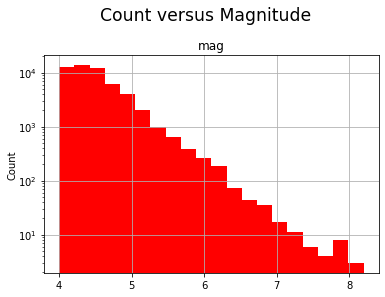

In [287]:
fig, ax = plt.subplots()
fig.text(0.04, 0.5, 'Count', va='center', rotation='vertical')
plt.suptitle('Count versus Magnitude of Earthquake', x=0.5, y=1.05, ha='center', fontsize='xx-large')
USGS.hist('mag', bins=20, color='red',ax=ax) 
ax.set_yscale('log')

Analyze the distribution of the Earthquake depths. This is, make a histogram of the Earthquake
count versus depth. Make sure to use a Logarithmic scale. What sort of relationship do you see? (20
points) Please add labels and colors to the plot.

Answer: The graph of logarithmic count vs depth seems to be bimodular graph. It can be expressed as:
If we divide depth into 3 caterogies : shallow, intermediate and deep
Then we can say most of the times the earthquakes are shallow. And have least frequency of being intermediate if compared to shallow and deep earthquakes.

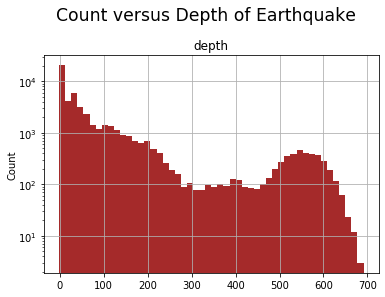

In [288]:
fig, ax = plt.subplots() 
fig.text(0.04, 0.5, 'Count', va='center', rotation='vertical')
plt.suptitle('Count versus Depth of Earthquake', x=0.5, y=1.05, ha='center', fontsize='xx-large')
USGS.hist('depth', bins=50, color='brown',ax=ax) 
ax.set_yscale('log')

Visualize the locations of earthquakes by making a scatterplot of their latitude and longitude. (20
points) Please add labels and colors to the plot.

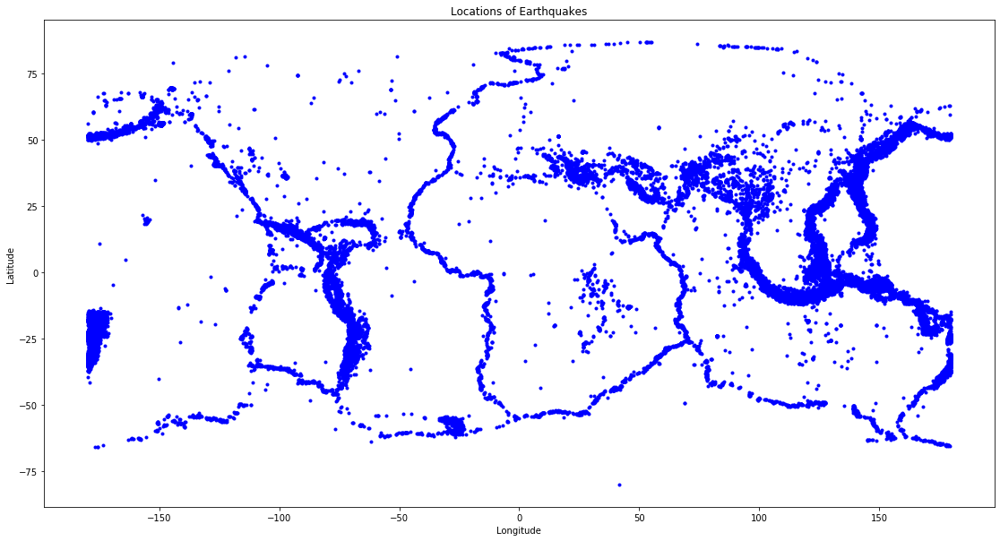

In [289]:
plt.figure(figsize=(19, 10))
plt.scatter(USGS['longitude'], USGS['latitude'], c='b', marker='.')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Locations of Earthquakes')
plt.show()

Using the US package (https://pypi.org/project/us/), clean the dataset you used previously to only
have data from the USA . You need to create a function that accommodates this. (20 points)

In [290]:
def get_only_USA_Data(full_USGS):
    USGS_con=pd.DataFrame(full_USGS[['mag','place']])
    con=USGS_con['place'].str.split(', ').tolist()
    country=[]
    for i,sub_list in enumerate(con):
        if(len(sub_list)<2):
            sub_list.append(np.nan)
        country.append(sub_list[1])
    USGS_con['place']=country

    US_list=[]
    for i in range(len(country)):
        if us.states.lookup(str(country[i])) is None:
            US_list.append(np.nan)
        else:
            US_list.append(country[i])

    USGS['UScheck']=US_list
    USGS_US=USGS.dropna(subset=['UScheck'])
    USGS_US=USGS_US.drop(columns=['UScheck'])
    return USGS_US

USGS_US=get_only_USA_Data(USGS)
USGS_US=USGS_US.reset_index(drop=True)
USGS_US.style


,Unnamed: 0,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,net,id,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,11,2016-12-31T09:41:58.440Z,18.6269,145.554,179.09,4.5,mb,0,121,3.374,0.23,us,us10007tyf,2017-03-23T22:52:11.040Z,"19km SW of Agrihan, Northern Mariana Islands",earthquake,8.1,10.1,0.121,20,reviewed,us,us
1,15,2016-12-31T05:21:21.180Z,51.9519,177.049,82.32,5.2,mb,0,120,1.968,0.94,us,us10007nuy,2019-06-17T22:52:47.755Z,"41km WSW of Kiska Volcano, Alaska",earthquake,8.5,6.9,0.063,82,reviewed,us,us
2,19,2016-12-30T21:08:34.060Z,13.3141,145.976,10,4.9,mb,0,63,1.111,0.97,us,us10007ntq,2017-03-23T22:52:10.040Z,"119km ESE of Yigo Mayor's Office, Guam",earthquake,6.7,1.9,0.054,107,reviewed,us,us
3,35,2016-12-30T11:21:48.050Z,18.4974,145.512,214.66,4.3,mb,0,117,3.249,0.86,us,us10007tqw,2017-03-23T22:52:10.040Z,"34km SSW of Agrihan, Northern Mariana Islands",earthquake,12.5,9.1,0.078,47,reviewed,us,us
4,99,2016-12-28T12:46:44.970Z,52.8468,-162.906,29.3,4.3,mb,0,0,0,0.99,us,us10007rif,2019-06-17T22:51:11.882Z,"225km S of False Pass, Alaska",earthquake,7.1,7.8,0.161,12,reviewed,ak,us
5,104,2016-12-28T09:13:47.243Z,38.3777,-118.896,8.8,5.5,ml,33,48.58,0.129,0.2187,nn,nn00570744,2018-07-02T18:09:28.104Z,"28km SW of Hawthorne, Nevada",earthquake,0,2,0.26,18,reviewed,nn,nn
6,105,2016-12-28T08:22:12.208Z,38.3904,-118.897,12.2,5.6,ml,43,42.44,0.123,0.1913,nn,nn00570710,2018-07-02T18:09:31.575Z,"26km SW of Hawthorne, Nevada",earthquake,0,1.2,0.32,18,reviewed,nn,nn
7,106,2016-12-28T08:18:00.613Z,38.3755,-118.899,11.3,5.6,ml,37,35.89,0.133,0.1599,nn,nn00570709,2018-07-02T18:09:31.243Z,"27km SW of Hawthorne, Nevada",earthquake,0,1,0.35,20,reviewed,nn,nn
8,115,2016-12-28T00:43:23.630Z,18.7338,145.669,213.34,4.4,mb,0,122,3.475,0.91,us,us10007n44,2017-03-23T22:52:05.040Z,"3km S of Agrihan, Northern Mariana Islands",earthquake,11.4,8,0.065,68,reviewed,us,us
9,142,2016-12-27T14:03:21.710Z,53.0182,-162.933,10,4.3,mb,0,165,1.864,1.06,us,us10007n0w,2019-06-17T22:50:19.332Z,"206km S of False Pass, Alaska",earthquake,8,1.9,0.073,53,reviewed,us,us


Find the top 10 US states where the strongest earthquakes occurred 

In [291]:
USGS_con=pd.DataFrame(USGS_US[['mag','place']])
con=USGS_con['place'].str.split(', ').tolist()
country=[]
for i,sub_list in enumerate(con):
    if(len(sub_list)<2):
        sub_list.append(np.nan)
    country.append(sub_list[1])
USGS_con['place']=country

US_list=[]
for i in range(len(country)):
    if us.states.lookup(str(country[i])) is None:
        US_list.append(np.nan)
    else:
        US_list.append(us.states.lookup(str(country[i])))
        
USGS_con['place']=US_list

USGS_con=USGS_con.sort_values(by=['mag'], ascending=False)
USGS_con=USGS_con.drop_duplicates(subset='place',keep='first')
topten=USGS_con['place'].head(10)
topten=pd.DataFrame(topten)
topten=topten.reset_index(drop=True)
topten.style

,place
0,Alaska
1,Northern Mariana Islands
2,Hawaii
3,California
4,Oregon
5,Puerto Rico
6,Guam
7,Montana
8,Oklahoma
9,Nevada


On a per-year basis, use a bar chart to plot the number of earthquakes for each of the following
magnitude groups ranges: Group 1: [4,4.5), Group 2: [4.5,5), Group 3: [5,6), Group 4: [6,7), Group 5:
(7,MAX]. Pay close attention to the group ranges. (10 points) Please add labels and colors to the plot.

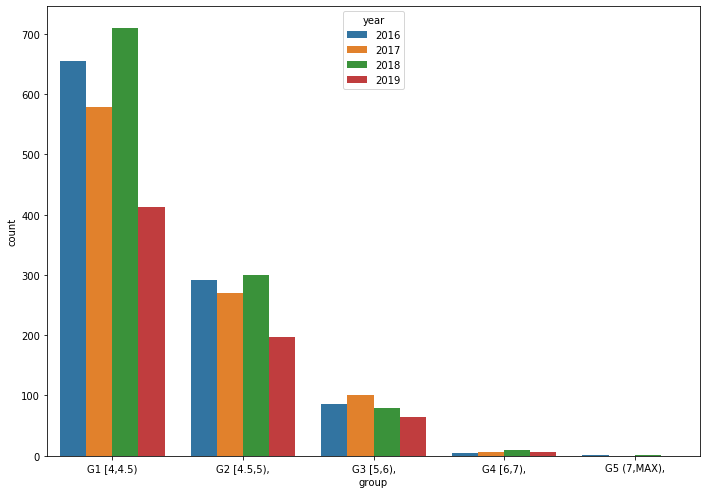

In [267]:
def categorize(USGS_201n, group_interval, group_names):
    group_intervals = [pd.Interval(*gi) for gi in group_interval]
    groups = []
    for mag in USGS_201n:
        GroupN = None
        for i, mag_group in enumerate(group_intervals):
            if mag in mag_group:
                GroupN = group_names[i]
                break
        groups.append(GroupN)
    #print(groups)
    return groups

group_interval=[(4,4.5,'left'),(4.5,5,'left'),(5,6,'left'),(6,7,'left'),(7,10,'right')]
group_names=['G1 [4,4.5)', 'G2 [4.5,5),', 'G3 [5,6),', 'G4 [6,7),', 'G5 (7,MAX),']

years=['2016','2017','2018','2019']
df4plot=pd.DataFrame()
df4plotf=pd.DataFrame()
for i, year in enumerate(years):
    USGS_year=USGS_US.loc[USGS_US.apply(lambda x: x['time'].split('-')[0]==year,axis=1),'mag']
    group=categorize(USGS_year, group_interval, group_names)
    df4plot=pd.DataFrame()
    df4plot['group']=group
    df4plot['year']=year
    df4plotf=df4plotf.append(df4plot)

df4plotf=df4plotf.sort_values(by=['group'])

a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
ax = sns.countplot(x="group", hue="year", data=df4plotf)

Visualize the locations of earthquakes by making a scatterplot of their latitude and longitude. Overlay
a US map on top of this plot to match the locations. (20 points) Please add labels and colors to the plot.

In [339]:
USGS_US_map=USGS_US
USGS_US_map['info']='mag:'+USGS_US_map['mag'].astype(str)+' loc:'+USGS_US_map['place']

fig = go.Figure(data=go.Scattergeo(
        lon = USGS_US_map['longitude'],
        lat = USGS_US_map['latitude'],
        text = USGS_US_map['info'],
        mode = 'markers',
        marker_color = USGS_US_map['mag'],
        ))

fig.update_layout(
        title = 'Earthquakes in USA<br>(Hover for magnitude)',
        geo_scope='usa',
    )
fig.show()